# **Proyecto Final : Clasificación de imágenes de gatos y perros utilizando Redes Neuronales Convolucionales (CNN)**


# 1. Importación de librerías

En esta sección se importan todas las librerías necesarias para el desarrollo del proyecto.

In [1]:
!pip install kagglehub imagehash

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 10.2 MB/s eta 0:00:00


In [2]:
# Librerías estándar
import os
import shutil
import random
from collections import Counter
import gc

# Procesamiento de imágenes
from PIL import Image, UnidentifiedImageError
import imagehash

# Visualización
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import (classification_report, confusion_matrix, roc_curve, auc, ConfusionMatrixDisplay)
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Deep Learning
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Kaggle
import kagglehub

# 2. Obtención del conjunto de datos

Se utiliza el dataset Microsoft Cats vs Dogs, disponible en Kaggle.

In [3]:
source = kagglehub.dataset_download("shaunthesheep/microsoft-catsvsdogs-dataset")

Using Colab cache for faster access to the 'microsoft-catsvsdogs-dataset' dataset.


In [4]:
dataset_path = "/content/dataset"
shutil.copytree(os.path.join(source, "PetImages"), dataset_path, dirs_exist_ok=True)

print(f"dataset path: {dataset_path}")

dataset path: /content/dataset


In [5]:
cats_path = os.path.join(dataset_path, 'Cat')
dogs_path = os.path.join(dataset_path, 'Dog')

# 3. Exploración inicial del dataset

En esta sección se analiza:

- Cantidad de imágenes por clase.
- Número total de imágenes.
- Ejemplos visuales.
- Resoluciones.

## 3.1 Distribución por clases

Se contabiliza el número de imágenes disponibles para cada categoría con el fin de verificar si el conjunto de datos presenta algún desbalance.

In [6]:
def count_images(folder):
    return sum(
        os.path.isfile(os.path.join(folder, f))
        for f in os.listdir(folder)
    )

print(f"Gatos: {count_images(cats_path)}")
print(f"Perros: {count_images(dogs_path)}")

Gatos: 12501
Perros: 12501


## 3.2 Listado de imágenes

Se construye una lista con todas las imágenes del dataset para facilitar los procesos posteriores de análisis y limpieza.

In [7]:
imagenes = []

for clase in ["Cat", "Dog"]:
    clase_path = os.path.join(dataset_path, clase)

    for archivo in os.listdir(clase_path):
        imagenes.append(
            os.path.join(clase_path, archivo)
        )

print(f"Total imágenes: {len(imagenes)}")

Total imágenes: 25002


## 3.3 Visualización de ejemplos

Se muestran imágenes aleatorias de ambas clases para inspeccionar visualmente:

- resolución
- formato
- calidad
- variabilidad del conjunto de datos


[Gato - Imagen 1]
  Ruta: /content/dataset/Cat/9519.jpg
  Tamaño (ancho x alto): 277x288 píxeles
  Modo de color: RGB
------------------------------
[Gato - Imagen 2]
  Ruta: /content/dataset/Cat/11937.jpg
  Tamaño (ancho x alto): 500x437 píxeles
  Modo de color: RGB
------------------------------
[Perro - Imagen 1]
  Ruta: /content/dataset/Dog/11755.jpg
  Tamaño (ancho x alto): 380x354 píxeles
  Modo de color: RGB
------------------------------
[Perro - Imagen 2]
  Ruta: /content/dataset/Dog/6361.jpg
  Tamaño (ancho x alto): 326x319 píxeles
  Modo de color: RGB
------------------------------


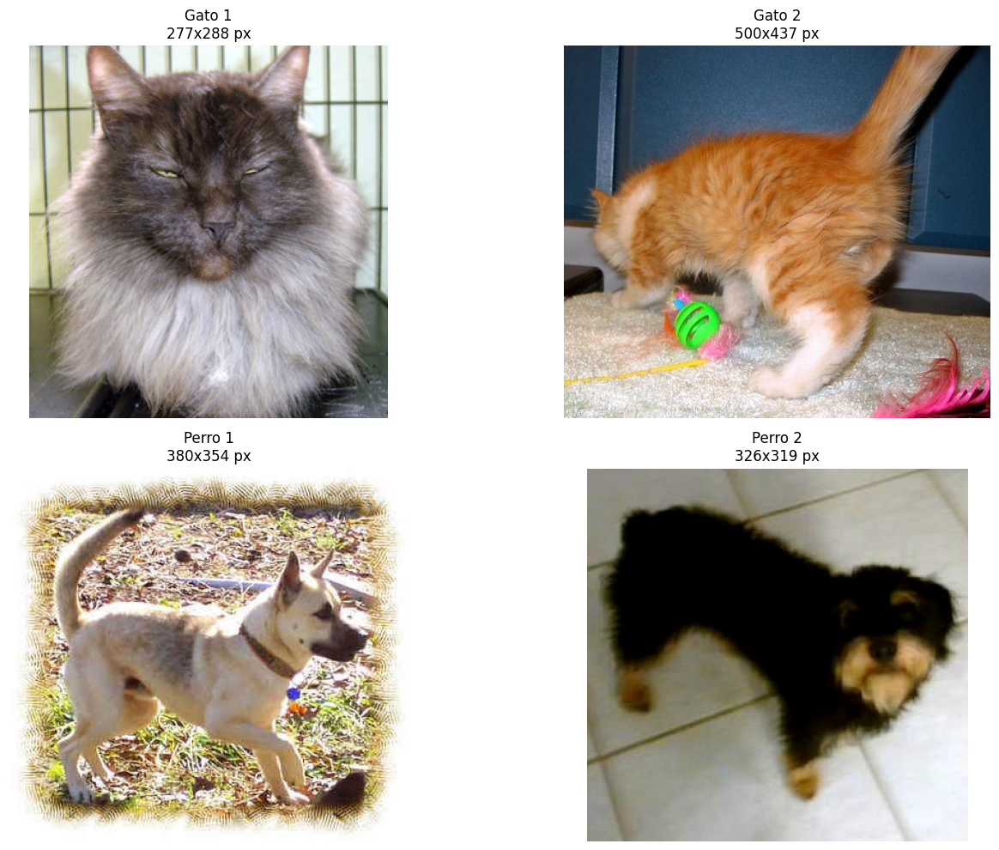

In [8]:
def display_random_images(dataset_path):
    """
    Selecciona 2 imágenes aleatorias de las carpetas 'Cat' y 'Dog' dentro de
    la ruta especificada, las imprime en pantalla y muestra su tamaño y resolución.

    Args:
        dataset_path (str): La ruta principal que contiene las subcarpetas 'Cat' y 'Dog',
                            e.g., "/kaggle/input/microsoft-catsvsdogs-dataset/PetImages".
    """
    cats_dir = os.path.join(dataset_path, 'Cat')
    dogs_dir = os.path.join(dataset_path, 'Dog')

    all_cat_images = []
    all_dog_images = []

    if os.path.exists(cats_dir) and os.path.isdir(cats_dir):
        for file_name in os.listdir(cats_dir):
            if file_name.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp')):
                all_cat_images.append(os.path.join(cats_dir, file_name))
    else:
        print(f"Advertencia: La carpeta de gatos no se encontró en: {cats_dir}")
        return

    if os.path.exists(dogs_dir) and os.path.isdir(dogs_dir):
        for file_name in os.listdir(dogs_dir):
            if file_name.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp')):
                all_dog_images.append(os.path.join(dogs_dir, file_name))
    else:
        print(f"Advertencia: La carpeta de perros no se encontró en: {dogs_dir}")
        return

    if len(all_cat_images) < 2:
        print(f"No hay suficientes imágenes de gatos (se encontraron {len(all_cat_images)}). Se necesitan al menos 2.")
        return
    if len(all_dog_images) < 2:
        print(f"No hay suficientes imágenes de perros (se encontraron {len(all_dog_images)}). Se necesitan al menos 2.")
        return

    selected_cat_images = random.sample(all_cat_images, 2)
    selected_dog_images = random.sample(all_dog_images, 2)

    all_selected_images = selected_cat_images + selected_dog_images

    plt.figure(figsize=(15, 10))

    for i, img_path in enumerate(all_selected_images):
        try:
            img = Image.open(img_path)
            width, height = img.size

            animal_type = "Gato" if os.path.basename(os.path.dirname(img_path)) == "Cat" else "Perro"

            print(f"[{animal_type} - Imagen {i%2 + 1}]")
            print(f"  Ruta: {img_path}")
            print(f"  Tamaño (ancho x alto): {width}x{height} píxeles")
            print(f"  Modo de color: {img.mode}")

            plt.subplot(2, 2, i + 1)
            plt.imshow(img)
            plt.title(f"{animal_type} {i%2 + 1}\n{width}x{height} px")
            plt.axis('off')
            img.close()

        except UnidentifiedImageError:
            print(f"ADVERTENCIA: No se pudo identificar el formato de la imagen en: {img_path}. Saltando.")
        except FileNotFoundError:
            print(f"ADVERTENCIA: Archivo no encontrado en: {img_path}. Saltando.")
        except OSError as e:
            print(f"ADVERTENCIA: Error al abrir la imagen {img_path}: {e}. Saltando.")
        print("-" * 30)

    plt.tight_layout()
    plt.show()

display_random_images(dataset_path)

# 4. Limpieza del conjunto de datos

En esta etapa se identifican y eliminan imágenes que podrían afectar el entrenamiento, incluyendo:

- Archivos corruptos
- Imágenes duplicadas
- Imágenes demasiado pequeñas

## 4.1 Eliminación de imágenes corruptas

Se verifica que cada archivo pueda abrirse correctamente utilizando PIL y TensorFlow, las imágenes dañadas son eliminadas para evitar errores durante el entrenamiento.

In [9]:
corruptos = []
imagenes_validas = []

for img_path in imagenes:
    try:
        with Image.open(img_path) as img:
            img.verify()
        contenido = tf.io.read_file(img_path)
        tf.image.decode_image(contenido, channels=3)
        imagenes_validas.append(img_path)
    except Exception as e:
        corruptos.append(img_path)
        print(f"Corrupta: {img_path} — {e}")
        try:
            os.remove(img_path)
        except:
            pass

print(f"Corruptas eliminadas: {len(corruptos)}")

imagenes = imagenes_validas
del imagenes_validas

tf.keras.backend.clear_session()
gc.collect()

Corrupta: /content/dataset/Cat/Thumbs.db — cannot identify image file '/content/dataset/Cat/Thumbs.db'
Corrupta: /content/dataset/Cat/666.jpg — cannot identify image file '/content/dataset/Cat/666.jpg'
Corrupta: /content/dataset/Cat/10404.jpg — {{function_node __wrapped__DecodeImage_device_/job:localhost/replica:0/task:0/device:CPU:0}} Unknown image file format. One of JPEG, PNG, GIF, BMP, WebP required. [Op:DecodeImage] name: 
Corrupta: /content/dataset/Cat/4351.jpg — {{function_node __wrapped__DecodeImage_device_/job:localhost/replica:0/task:0/device:CPU:0}} Input size should match (header_size + row_size * abs_height) but they differ by 2 [Op:DecodeImage] name: 
Corrupta: /content/dataset/Dog/9500.jpg — {{function_node __wrapped__DecodeImage_device_/job:localhost/replica:0/task:0/device:CPU:0}} Number of channels inherent in the image must be 1, 3 or 4, was 2 [Op:DecodeImage] name: 
Corrupta: /content/dataset/Dog/2494.jpg — {{function_node __wrapped__DecodeImage_device_/job:localhos

/usr/local/lib/python3.12/dist-packages/PIL/TiffImagePlugin.py:950: UserWarning: Truncated File Read
  warnings.warn(str(msg))


Corruptas eliminadas: 11


0

## 4.2 Análisis de dimensiones

Se estudian las dimensiones de las imágenes para conocer la variabilidad existente en el dataset.

In [10]:
anchos = []
altos = []

for img_path in imagenes:
    with Image.open(img_path) as img:
        anchos.append(img.width)
        altos.append(img.height)

print("ANCHO")
print(f"Mínimo: {min(anchos)} | Máximo: {max(anchos)} | Promedio: {np.mean(anchos):.2f}")
print("\nALTO")
print(f"Mínimo: {min(altos)} | Máximo: {max(altos)} | Promedio: {np.mean(altos):.2f}")

ANCHO
Mínimo: 4 | Máximo: 500 | Promedio: 404.47

ALTO
Mínimo: 4 | Máximo: 500 | Promedio: 361.02


## 4.3 Distribución de tamaños

Se utilizan histogramas para observar la distribución del ancho y alto de las imágenes.

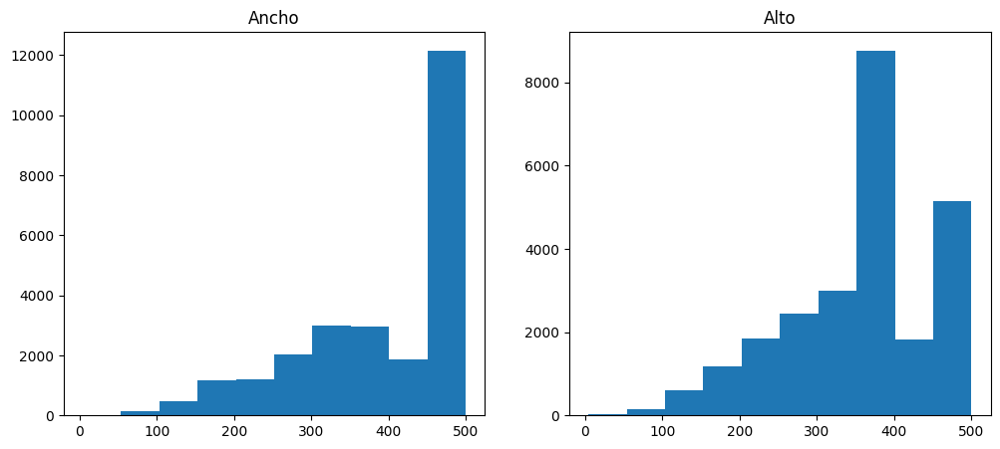

In [11]:
fig, ax = plt.subplots(1,2, figsize=(12,5))

ax[0].hist(anchos)
ax[0].set_title("Ancho")

ax[1].hist(altos)
ax[1].set_title("Alto")

plt.show()

## 4.4 Relación entre ancho y alto

El gráfico de dispersión permite visualizar las distintas resoluciones presentes dentro del conjunto de datos.

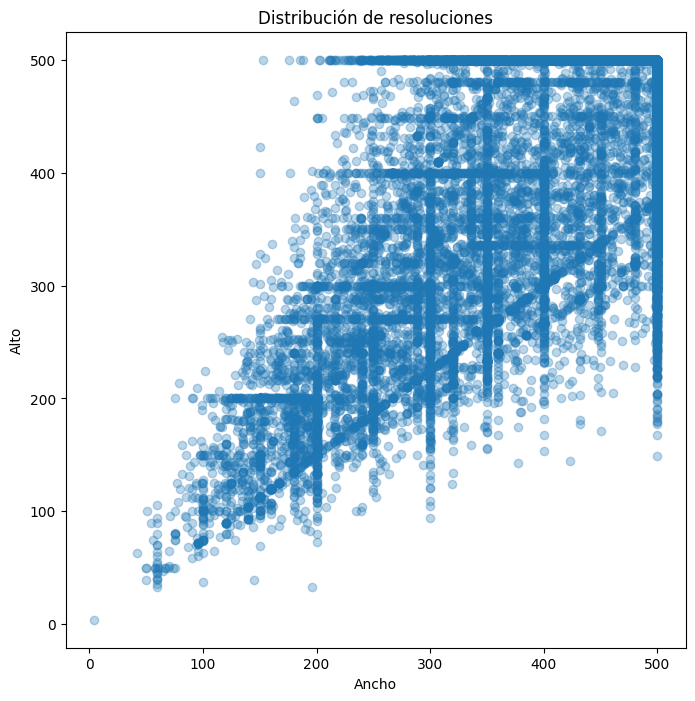

3129

In [12]:
plt.figure(figsize=(8,8))
plt.scatter(anchos, altos, alpha=0.3)
plt.xlabel("Ancho")
plt.ylabel("Alto")
plt.title("Distribución de resoluciones")
plt.show()

del anchos, altos
import gc; gc.collect()

## 4.5 Detección de imágenes duplicadas

Se utiliza el algoritmo Perceptual Hash (pHash) para identificar imágenes visualmente iguales, la eliminación de duplicados evita que el modelo aprenda información repetida.

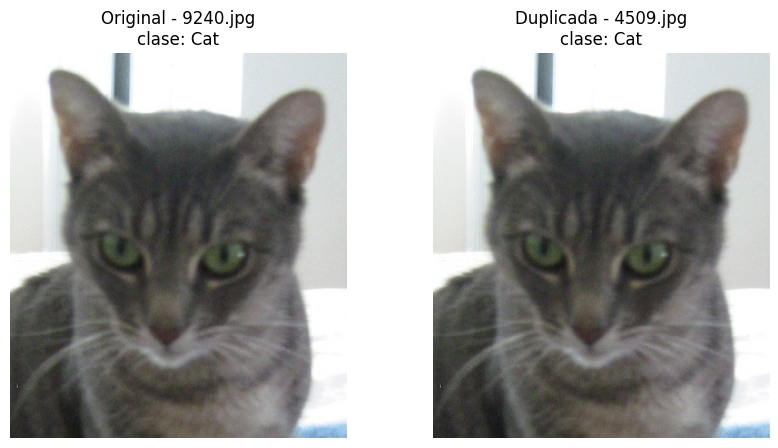

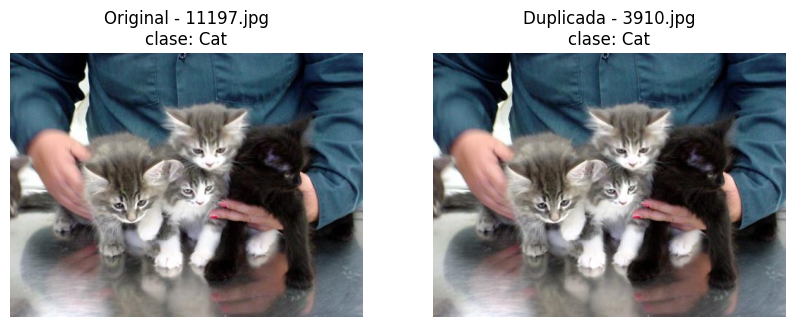

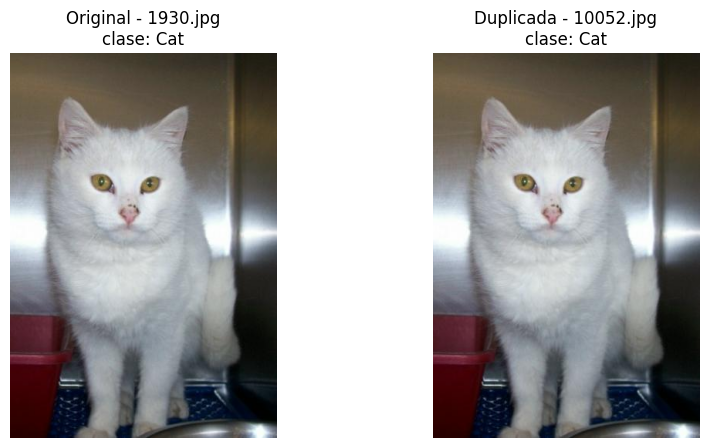

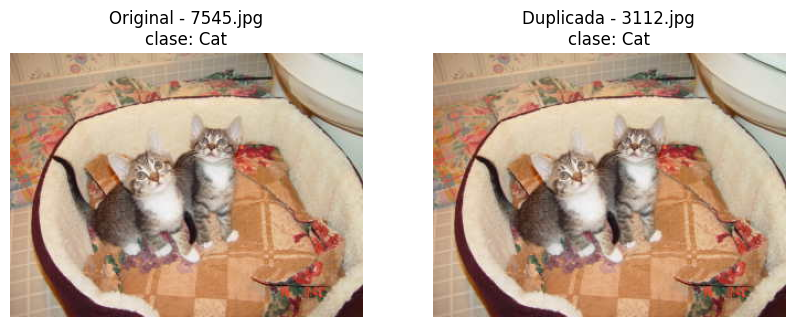

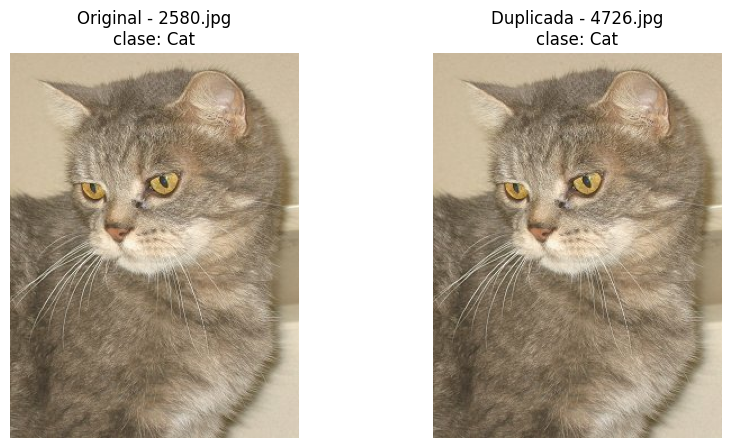

...

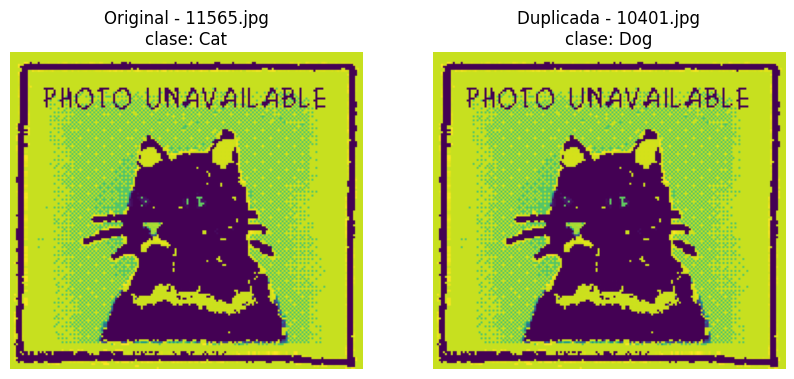

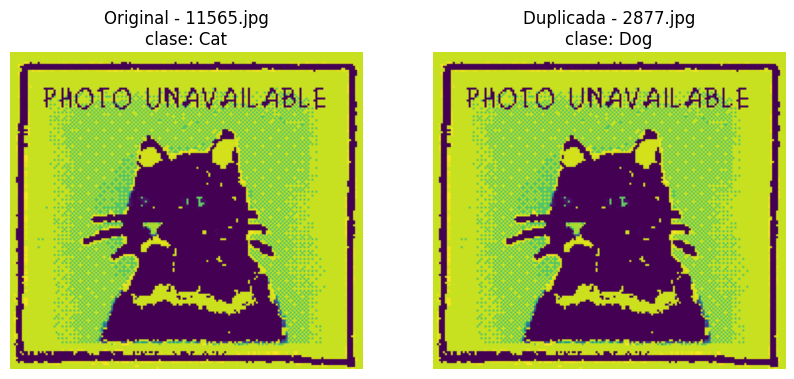

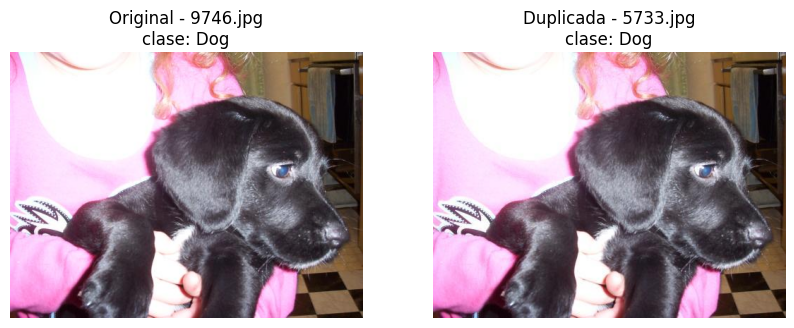

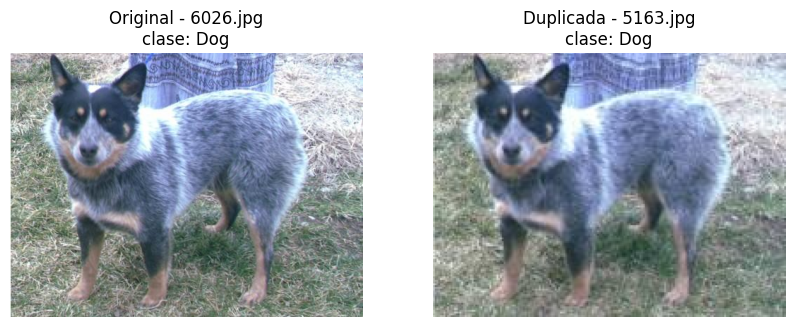

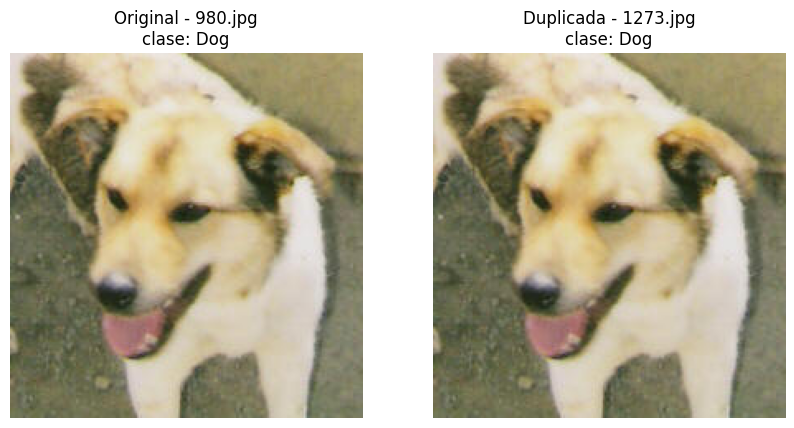



--------------- 36 imágenes duplicadas ---------------


115932

In [13]:
hashes = {}
imagenes_duplicadas = []

for path in imagenes:
    with Image.open(path) as img:
        h = str(imagehash.phash(img))

    if h in hashes:
        original = hashes[h]
        duplicada = path

        imagenes_duplicadas.append(duplicada)

        with Image.open(original) as img_o:
            arr_orig = np.array(img_o)
            cat_orig = os.path.basename(os.path.dirname(original))
        with Image.open(duplicada) as img_d:
            arr_dup = np.array(img_d)
            cat_dup = os.path.basename(os.path.dirname(duplicada))

        plt.figure(figsize=(10, 5))

        plt.subplot(1, 2, 1)
        plt.imshow(arr_orig)
        plt.title(f"Original - {os.path.basename(original)}\nclase: {cat_orig}")
        plt.axis("off")

        plt.subplot(1, 2, 2)
        plt.imshow(arr_dup)
        plt.title(f"Duplicada - {os.path.basename(duplicada)}\nclase: {cat_dup}")
        plt.axis("off")

        plt.show()

        del arr_orig, arr_dup

    else:
        hashes[h] = path

print(f"\n\n--------------- {len(imagenes_duplicadas)} imágenes duplicadas ---------------")

del hashes
gc.collect()

Eliminación de imagenes duplicadas

In [14]:
# Imágenes detectadas en duplicados que no son gatos reales
imagenes_duplicadas.append("/content/dataset/Cat/11565.jpg")
imagenes_duplicadas.append("/content/dataset/Cat/8456.jpg")

for archivo in imagenes_duplicadas:
    if os.path.exists(archivo):
        os.remove(archivo)

imagenes = [p for p in imagenes if os.path.exists(p)]
print(f"Eliminadas {len(imagenes_duplicadas)} imágenes duplicadas")
print(f"Imágenes restantes: {len(imagenes)}")

gc.collect()

Eliminadas 38 imágenes duplicadas
Imágenes restantes: 24953


0

## 4.6 Eliminación de imágenes de baja resolución

Las imágenes con dimensiones menores a 100 píxeles son eliminadas debido a que contienen poca información visual y podrían afectar negativamente el aprendizaje del modelo.

In [15]:
small_images = []

for img_path in imagenes:
    try:
        with Image.open(img_path) as img:

            if img.width < 100 or img.height < 100:
                small_images.append(img_path)

    except:
        pass

print(f"Imágenes pequeñas: {len(small_images)}")

Imágenes pequeñas: 179


Eliminación de imagenes menores a 100 px

In [16]:
def detectar_imagenes_pequenas(dataset_path, threshold=100):
    small_images = []

    for clase in ["Cat", "Dog"]:
        clase_path = os.path.join(dataset_path, clase)

        if not os.path.exists(clase_path):
            continue

        for img_file in os.listdir(clase_path):
            full_path = os.path.join(clase_path, img_file)

            if not os.path.isfile(full_path):
                continue

            try:
                with Image.open(full_path) as img:
                    if img.width < threshold or img.height < threshold:
                        small_images.append(full_path)
                        Image.close(img)

            except Exception:
                pass

    return small_images

small_images = detectar_imagenes_pequenas(dataset_path, threshold=100)

print(f"Imágenes pequeñas encontradas: {len(small_images)}")

Imágenes pequeñas encontradas: 179


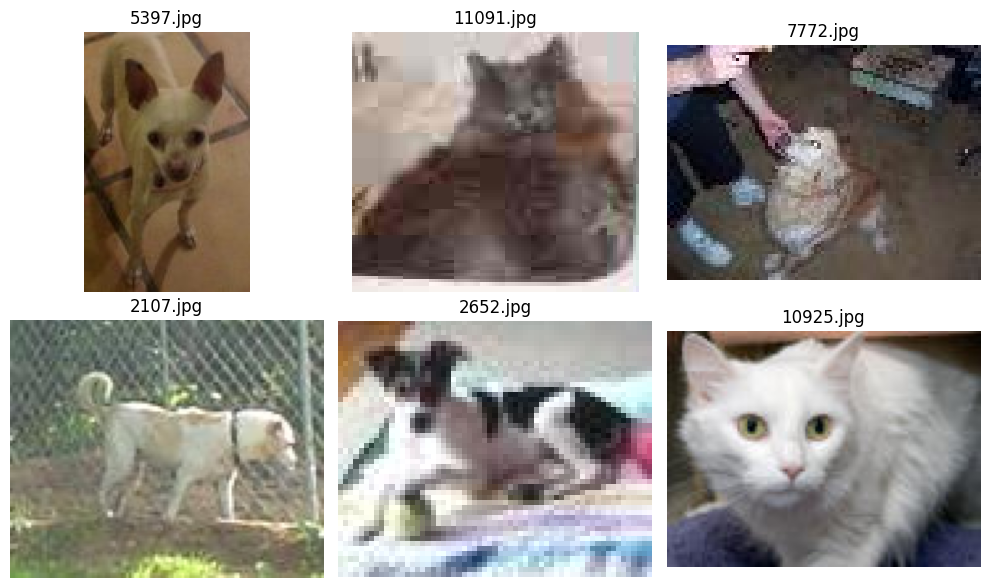

In [17]:
if small_images:
    sample = random.sample(small_images, min(6, len(small_images)))

    plt.figure(figsize=(10, 6))

    for i, path in enumerate(sample):
        with Image.open(path) as img:
            arr = np.array(img)
        plt.subplot(2, 3, i + 1)
        plt.imshow(arr)
        plt.title(os.path.basename(path))
        plt.axis("off")
        del arr

    plt.tight_layout()
    plt.show()

In [18]:
def eliminar_imagenes(paths):
    deleted = 0
    for path in paths:
        try:
            if os.path.exists(path):
                os.remove(path)
                deleted += 1
        except Exception as e:
            print(f"Error eliminando {path}: {e}")
    return deleted

deleted_count = eliminar_imagenes(small_images)
print(f"Imágenes pequeñas eliminadas: {deleted_count}")

imagenes = [p for p in imagenes if os.path.exists(p)]
print(f"Imágenes válidas para entrenamiento: {len(imagenes)}")

del imagenes, small_images
import gc; gc.collect()
print("Memoria de exploración liberada.")

Imágenes pequeñas eliminadas: 179
Imágenes válidas para entrenamiento: 24774
Memoria de exploración liberada.


# 5. Entrenamiento del modelo

Después de finalizar la limpieza del conjunto de datos se procede a preparar la información para entrenar la red neuronal convolucional.

## 5.1 Preparación del dataset

Las imágenes son cargadas utilizando TensorFlow.

Se divide automáticamente el conjunto de datos en:

- 80 % entrenamiento
- 20 % validación

Además, todas las imágenes son redimensionadas a 128 × 128 píxeles.

In [19]:
dataset_path = "/content/dataset"

IMAGE_SIZE = (128, 128)
BATCH_SIZE = 32

train_ds = tf.keras.utils.image_dataset_from_directory(
    dataset_path,
    validation_split=0.2,
    subset="training",
    seed=123,
    image_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE
)

val_ds = tf.keras.utils.image_dataset_from_directory(
    dataset_path,
    validation_split=0.2,
    subset="validation",
    seed=123,
    image_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE
)

Found 24774 files belonging to 2 classes.
Using 19820 files for training.
Found 24774 files belonging to 2 classes.
Using 4954 files for validation.


## 5.2 Verificación de clases

Se verifica que TensorFlow haya identificado correctamente las dos categorías del problema.

In [20]:
print(train_ds.class_names)

['Cat', 'Dog']


## 5.3 Preprocesamiento y Data Augmentation

Antes del entrenamiento se aplican técnicas de preprocesamiento para mejorar la capacidad de generalización del modelo.

Las transformaciones incluyen:

- Normalización de los píxeles.
- Volteo horizontal aleatorio.
- Variaciones de brillo.
- Variaciones de contraste.

In [21]:
gc.collect()
tf.keras.backend.clear_session()

AUTOTUNE = tf.data.AUTOTUNE

# Augmentation
def preprocess_train(x, y):
    x = tf.cast(x, tf.float32) / 255.0
    x = tf.image.random_flip_left_right(x)
    x = tf.image.random_brightness(x, 0.1)
    x = tf.image.random_contrast(x, 0.9, 1.1)
    return x, y

def preprocess_val(x, y):
    x = tf.cast(x, tf.float32) / 255.0
    return x, y

train_ds = train_ds.map(preprocess_train, num_parallel_calls=AUTOTUNE).shuffle(200).prefetch(AUTOTUNE)
val_ds   = val_ds.map(preprocess_val,   num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)

## 5.4 Arquitectura de la CNN

Se implementa una Red Neuronal Convolucional compuesta por tres bloques convolucionales.

Cada bloque incluye:

- Convolución
- Batch Normalization
- Max Pooling
- Dropout

Finalmente, una capa completamente conectada realiza la clasificación binaria utilizando una función de activación Sigmoid.

In [22]:
model = models.Sequential([
    # Bloque 1
    layers.Conv2D(32, (3,3), activation='relu', padding='same', input_shape=(128, 128, 3)),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Dropout(0.25),

    # Bloque 2
    layers.Conv2D(64, (3,3), activation='relu', padding='same'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Dropout(0.25),

    # Bloque 3
    layers.Conv2D(128, (3,3), activation='relu', padding='same'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Dropout(0.25),

    # Clasificador
    layers.Flatten(),
    layers.Dense(256, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')
])

model.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │     8,388,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,484,289 (32.36 MB)

 Trainable params: 8,483,329 (32.36 MB)

 Non-trainable params: 960 (3.75 KB)

## 5.5 Compilación del modelo

El modelo utiliza:

- Optimizador Adam.
- Función de pérdida Binary Crossentropy.
- Accuracy como métrica principal.

In [23]:
model.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)

## 5.6 Estrategias para mejorar el entrenamiento

Se utilizan dos callbacks:

- **EarlyStopping**: Detiene el entrenamiento cuando el modelo deja de mejorar.

- **ReduceLROnPlateau**: Reduce automáticamente la tasa de aprendizaje cuando la pérdida de validación deja de disminuir.

In [24]:
callbacks = [
    EarlyStopping(
        monitor='val_loss',
        patience=4,
        restore_best_weights=True,
        verbose=1
    ),
    ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=2,
        min_lr=1e-6,
        verbose=1
    )
]

## 5.7 Entrenamiento del modelo

Se entrena la red neuronal durante un máximo de 30 épocas. El proceso puede finalizar antes gracias al mecanismo de Early Stopping.

In [25]:
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=30,
    callbacks=callbacks
)

Epoch 1/30
620/620 ━━━━━━━━━━━━━━━━━━━━ 51s 54ms/step - accuracy: 0.6729 - loss: 0.6532 - val_accuracy: 0.7301 - val_loss: 0.5395 - learning_rate: 0.0010
Epoch 2/30
620/620 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - accuracy: 0.7620 - loss: 0.4919 - val_accuracy: 0.6843 - val_loss: 0.7442 - learning_rate: 0.0010
Epoch 3/30
620/620 ━━━━━━━━━━━━━━━━━━━━ 39s 50ms/step - accuracy: 0.8031 - loss: 0.4220 - val_accuracy: 0.7856 - val_loss: 0.4581 - learning_rate: 0.0010
Epoch 4/30
620/620 ━━━━━━━━━━━━━━━━━━━━ 33s 42ms/step - accuracy: 0.8295 - loss: 0.3802 - val_accuracy: 0.6839 - val_loss: 0.8219 - learning_rate: 0.0010
Epoch 5/30
619/620 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - accuracy: 0.8402 - loss: 0.3573
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
620/620 ━━━━━━━━━━━━━━━━━━━━ 33s 42ms/step - accuracy: 0.8432 - loss: 0.3556 - val_accuracy: 0.7913 - val_loss: 0.4969 - learning_rate: 0.0010
Epoch 6/30
620/620 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - accuracy: 0.8750 - los

# 6. Evaluación del modelo

Una vez entrenado el modelo se evalúa su desempeño utilizando diferentes métricas de clasificación.

In [26]:
y_true = []
y_pred_prob = []

for images, labels in val_ds:
    preds = model.predict(images, verbose=0)
    y_pred_prob.extend(preds.flatten())
    y_true.extend(labels.numpy())

y_true = np.array(y_true)
y_pred_prob = np.array(y_pred_prob)
y_pred = (y_pred_prob > 0.5).astype(int)

class_names = ["Cat", "Dog"]

## 6.1 Curvas de entrenamiento

Se analizan las curvas de Accuracy y Loss para observar el comportamiento del modelo durante el entrenamiento y verificar posibles problemas de overfitting o underfitting.

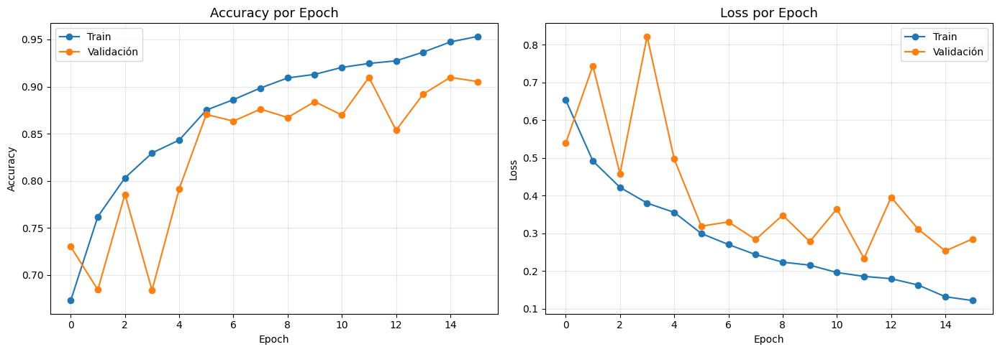

In [27]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Accuracy
axes[0].plot(history.history['accuracy'], label='Train', marker='o')
axes[0].plot(history.history['val_accuracy'], label='Validación', marker='o')
axes[0].set_title('Accuracy por Epoch', fontsize=13)
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Loss
axes[1].plot(history.history['loss'], label='Train', marker='o')
axes[1].plot(history.history['val_loss'], label='Validación', marker='o')
axes[1].set_title('Loss por Epoch', fontsize=13)
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('/content/curvas_entrenamiento.png', dpi=150, bbox_inches='tight')
plt.show()

## 6.2 Matriz de confusión

La matriz de confusión muestra el número de clasificaciones correctas e incorrectas realizadas por el modelo para cada categoría.

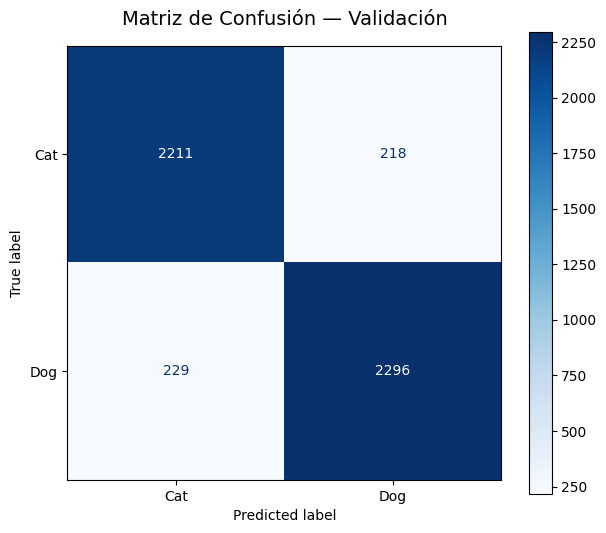


Métricas de Clasificación
Verdaderos Negativos (Cat correctos) : 2211
Falsos Positivos    (Cat → Dog)      : 218
Falsos Negativos    (Dog → Cat)      : 229
Verdaderos Positivos (Dog correctos) : 2296


In [34]:
cm = confusion_matrix(y_true, y_pred)

fig, ax = plt.subplots(figsize=(7, 6))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(ax=ax, colorbar=True, cmap='Blues')

ax.set_title('Matriz de Confusión — Validación', fontsize=14, pad=15)
plt.savefig('/content/matriz_confusion.png', dpi=150, bbox_inches='tight')
plt.show()

tn, fp, fn, tp = cm.ravel()

print()
print("=" * 50)
print("Métricas de Clasificación")
print("=" * 50)
print(f"Verdaderos Negativos (Cat correctos) : {tn}")
print(f"Falsos Positivos    (Cat → Dog)      : {fp}")
print(f"Falsos Negativos    (Dog → Cat)      : {fn}")
print(f"Verdaderos Positivos (Dog correctos) : {tp}")

## 6.3 Reporte de clasificación

Se presentan las métricas:

- Precision
- Recall
- F1-Score

para ambas clases.

In [29]:
print("=" * 50)
print("REPORTE DE CLASIFICACIÓN")
print("=" * 50)
print(classification_report(y_true, y_pred, target_names=class_names, digits=4))


REPORTE DE CLASIFICACIÓN
              precision    recall  f1-score   support

         Cat     0.9061    0.9103    0.9082      2429
         Dog     0.9133    0.9093    0.9113      2525

    accuracy                         0.9098      4954
   macro avg     0.9097    0.9098    0.9097      4954
weighted avg     0.9098    0.9098    0.9098      4954



## 6.4 Curva ROC

La curva ROC permite analizar la capacidad discriminativa del modelo para distinguir entre ambas clases. También se calcula el área bajo la curva (AUC).

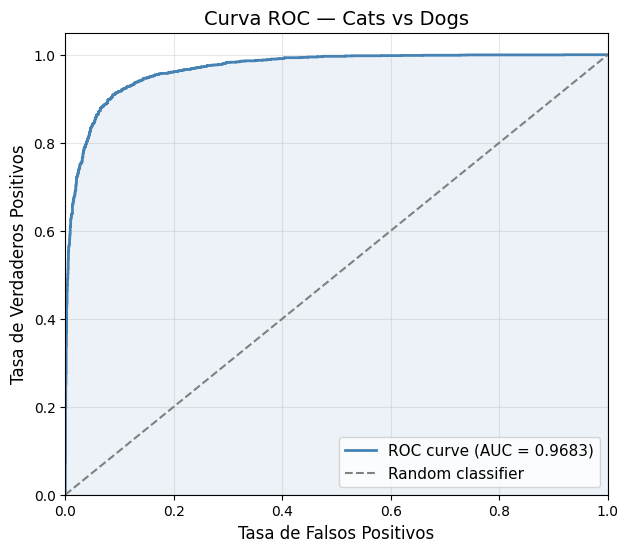

In [30]:
fpr, tpr, thresholds = roc_curve(y_true, y_pred_prob)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(7, 6))
plt.plot(fpr, tpr, color='steelblue', lw=2, label=f'ROC curve (AUC = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--', label='Random classifier')
plt.fill_between(fpr, tpr, alpha=0.1, color='steelblue')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos', fontsize=12)
plt.ylabel('Tasa de Verdaderos Positivos', fontsize=12)
plt.title('Curva ROC — Cats vs Dogs', fontsize=14)
plt.legend(loc="lower right", fontsize=11)
plt.grid(True, alpha=0.3)
plt.savefig('/content/curva_roc.png', dpi=150, bbox_inches='tight')
plt.show()

## 6.5 Resumen de métricas

Se presentan las métricas finales obtenidas por el modelo:

- Accuracy
- Precision
- Recall
- F1-Score
- AUC
- Validation Loss

Estas métricas permiten evaluar el desempeño global del clasificador.

In [31]:
acc   = accuracy_score(y_true, y_pred)
prec  = precision_score(y_true, y_pred)
rec   = recall_score(y_true, y_pred)
f1    = f1_score(y_true, y_pred)
loss_val, _ = model.evaluate(val_ds, verbose=0)

print("=" * 45)
print("         RESUMEN DE MÉTRICAS FINALES")
print("=" * 45)
print(f"  Accuracy            : {acc:.4f}  ({acc*100:.2f}%)")
print(f"  Precision           : {prec:.4f}")
print(f"  Recall              : {rec:.4f}")
print(f"  F1-Score            : {f1:.4f}")
print(f"  AUC-ROC             : {roc_auc:.4f}")
print(f"  Val Loss            : {loss_val:.4f}")
print("=" * 45)
best_epoch = np.argmin(history.history['val_loss']) + 1
print(f"  Mejor epoch         : {best_epoch}")
print(f"  Val accuracy en ese epoch: {history.history['val_accuracy'][best_epoch-1]*100:.2f}%")
print("=" * 45)

         RESUMEN DE MÉTRICAS FINALES
  Accuracy            : 0.9098  (90.98%)
  Precision           : 0.9133
  Recall              : 0.9093
  F1-Score            : 0.9113
  AUC-ROC             : 0.9683
  Val Loss            : 0.2339
  Mejor epoch         : 12
  Val accuracy en ese epoch: 90.98%


## 6.6 Predicciones sobre imágenes de validación

Finalmente, se muestran ejemplos de imágenes junto con su etiqueta real y la predicción realizada por la red neuronal.

Las predicciones correctas se muestran en color verde y las incorrectas en color rojo.

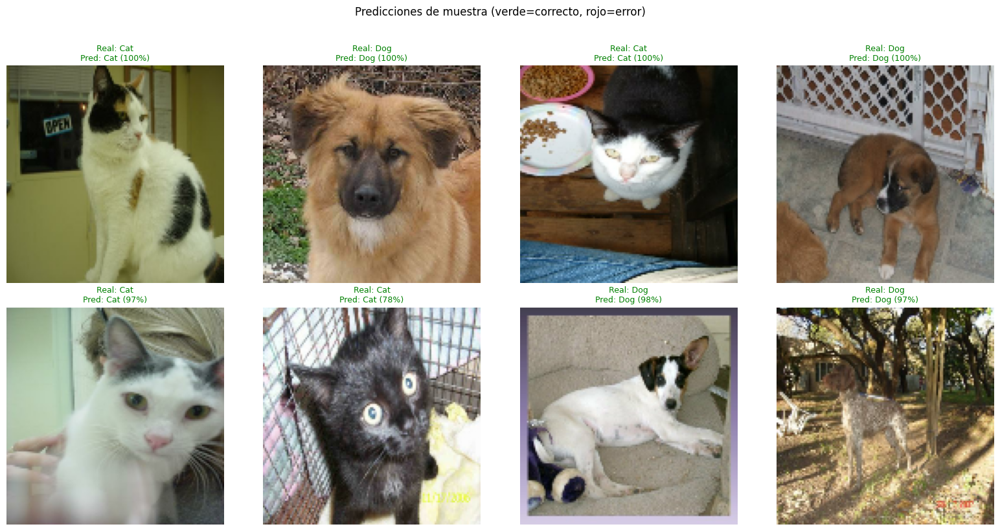

In [32]:
plt.figure(figsize=(16, 8))

for images, labels in val_ds.take(1):
    preds = model.predict(images, verbose=0)
    for i in range(min(8, len(images))):
        ax = plt.subplot(2, 4, i + 1)
        plt.imshow(images[i].numpy())

        prob = float(preds[i][0])
        pred_class = class_names[int(prob > 0.5)]
        real_class = class_names[int(labels[i])]
        conf = prob if prob > 0.5 else 1 - prob

        color = 'green' if pred_class == real_class else 'red'
        plt.title(f"Real: {real_class}\nPred: {pred_class} ({conf:.0%})", color=color, fontsize=9)
        plt.axis("off")

plt.suptitle("Predicciones de muestra (verde=correcto, rojo=error)", fontsize=12, y=1.02)
plt.tight_layout()
plt.show()

# 7. Conclusiones

En este proyecto se desarrolló un modelo de clasificación de imágenes utilizando Redes Neuronales Convolucionales para distinguir entre gatos y perros.

La etapa de exploración permitió identificar problemas de calidad en el conjunto de datos, como imágenes corruptas, duplicadas y de baja resolución, las cuales fueron eliminadas antes del entrenamiento.

El uso de técnicas de preprocesamiento, normalización y Data Augmentation permitió mejorar la capacidad de generalización del modelo.

Finalmente, las métricas obtenidas muestran que la arquitectura implementada es capaz de realizar la clasificación con un alto nivel de desempeño, demostrando la efectividad de las CNN para tareas de visión por computadora.

# 8. Liberar recursos

In [33]:
del model
tf.keras.backend.clear_session()
gc.collect()

0